In [1]:
import os
from os.path import join, exists, basename
from glob import glob
import matplotlib.pyplot as plt
import rasterio as rio
import numpy as np
import pandas as pd
import matplotlib
import copy
from scipy import interpolate
from scipy.signal import correlate2d
from sklearn.preprocessing import normalize

In [2]:
df = pd.read_csv('../../data/wx_station/banner/312_STAND_YEAR=2021.csv', skiprows=3)
df.Date = pd.to_datetime(df.Date)
df = df.set_index('Date')

In [3]:
data_dir = '../../data/jpl/'
cor_fps = glob(join(data_dir, '*cor.grd.clip.ma.tiff'))
unw_fps = glob(join(data_dir, '*unw.grd.clip.ma.tiff'))
inc_fp = glob(join(data_dir, '*inc*'))[0]
sd_fp = glob(join(data_dir, '*snow_depth*'))[0]

In [4]:
unw_names = [basename(i).split('.')[0] for i in unw_fps]

date_dic = {'lowman_23205_21015-008_21017-018_0007d_s01_L090HH_01':['2021-03-03','2021-03-10'],
 'lowman_23205_20002-007_20007-003_0013d_s01_L090HH_01':['2020-01-31','2020-02-13'],
 'lowman_23205_20007-003_20011-003_0008d_s01_L090HH_01':['2020-02-13','2020-02-21'],
 'lowman_23205_21004-003_21008-000_0007d_s01_L090HH_01':['2021-01-20','2021-01-27'],
 'lowman_23205_21019-018_21021-006_0006d_s01_L090HH_01':['2021-03-16','2021-03-22'],
 'lowman_23205_21012-000_21015-008_0021d_s01_L090HH_01':['2021-02-10','2021-03-03'],
 'lowman_23205_20011-003_20016-004_0019d_s01_L090HH_01':['2020-02-21','2020-03-11'],
 'lowman_23205_21009-004_21012-000_0007d_s01_L090HH_01':['2021-02-03','2021-02-10'],
 'lowman_23205_21017-018_21019-018_0006d_s01_L090HH_01':['2021-03-10','2021-03-16'],
 'lowman_23205_19084-017_20002-007_0042d_s01_L090HH_01':['2019-12-20','2020-01-31']}
 
date_dic = {k:pd.to_datetime(v) for (k,v) in date_dic.items()}

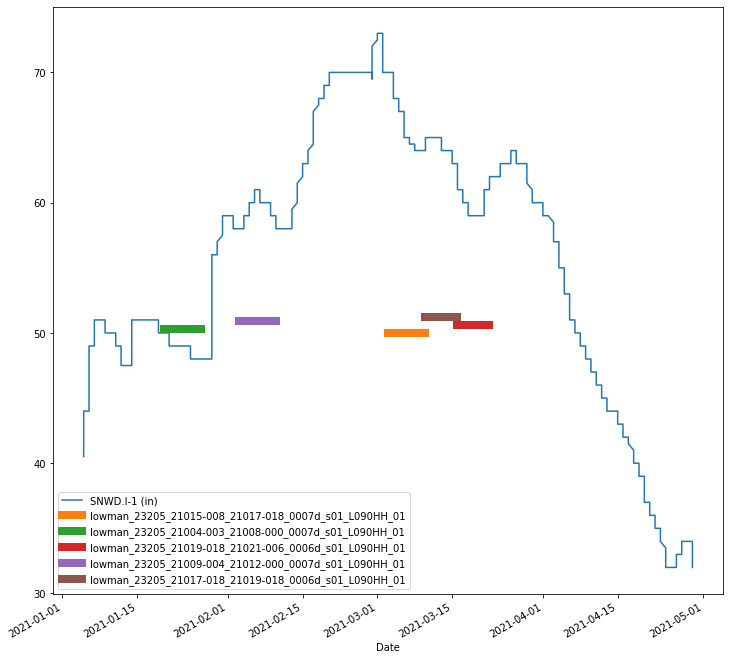

In [5]:
a = df['SNWD.I-1 (in) '][df.index < pd.to_datetime('2021-04-30')].rolling(window = 100).median()
a.plot(figsize = (12,12))
i = 50
for k, v in date_dic.items():
    if v[0]>pd.to_datetime('2021-01-01') and k in unw_names:
        plt.plot(v, [i,i], linewidth = 8, label = k)
        i +=0.3
plt.legend()

../../data/jpl/lowman_23205_21009-004_21012-000_0007d_s01_L090HH_01.unw.grd.clip.ma.tiff


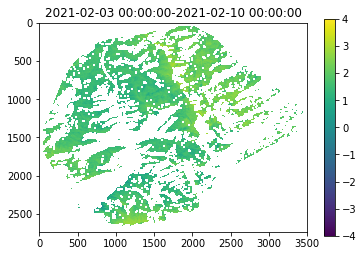

../../data/jpl/lowman_23205_21015-008_21017-018_0007d_s01_L090HH_01.unw.grd.clip.ma.tiff


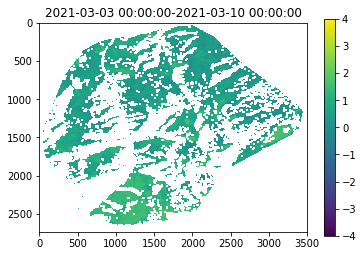

../../data/jpl/lowman_23205_21019-018_21021-006_0006d_s01_L090HH_01.unw.grd.clip.ma.tiff


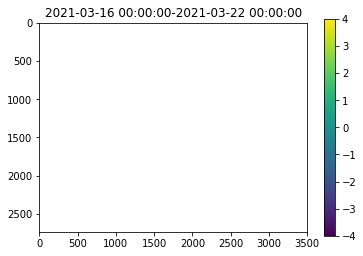

../../data/jpl/lowman_23205_20007-003_20011-003_0008d_s01_L090HH_01.unw.grd.clip.ma.tiff


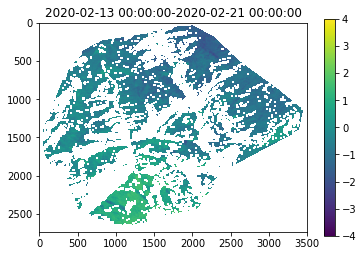

../../data/jpl/lowman_23205_21004-003_21008-000_0007d_s01_L090HH_01.unw.grd.clip.ma.tiff


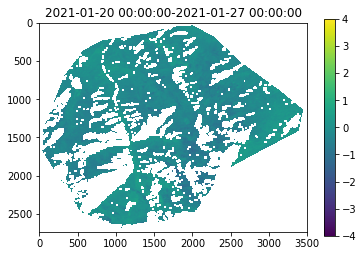

../../data/jpl/lowman_23205_20011-003_20016-004_0019d_s01_L090HH_01.unw.grd.clip.ma.tiff


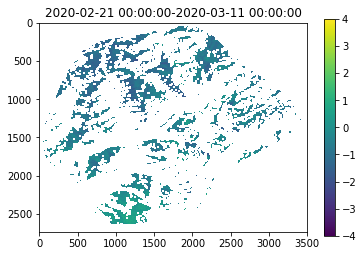

../../data/jpl/lowman_23205_21017-018_21019-018_0006d_s01_L090HH_01.unw.grd.clip.ma.tiff


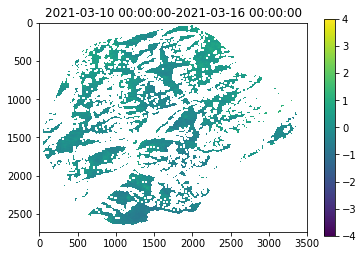

In [6]:
for im in unw_fps:
    with rio.open(im) as src:
        plt.imshow(src.read(1), vmin = -4, vmax = 4)
        plt.colorbar()
        dates = date_dic[basename(im).split('.')[0]]
        plt.title(f'{dates[0]}-{dates[1]}')
        print(im)
        plt.show()

## February 3 to 10 analysis

In [7]:
date_dic[basename(unw_fps[0]).split('.')[0]]

DatetimeIndex(['2021-02-03', '2021-02-10'], dtype='datetime64[ns]', freq=None)

In [8]:
with rio.open(sd_fp) as sd, rio.open(inc_fp) as inc:
    sd = sd.read(1)
    inc = inc.read(1)
    inc[np.isnan(sd)] = np.nan

In [9]:
with rio.open(unw_fps[0]) as unw:
    unw = unw.read(1)

In [10]:
def epsilon_density(p):
    return 1 + 1.6*p + 1.8 * p**3
epsilon_density(.25)

def invert_sd(unw, inc, wavelength = 0.238403545, epsilon = 1.42):
    sd = - (unw * wavelength)/ (4 * np.pi) / (np.cos(inc) - np.sqrt(epsilon - (np.sin(inc)**2)))
    return sd
v_inversion = np.vectorize(invert_sd)

In [11]:
def invert_sd(unw, inc, wavelength = 0.238403545, epsilon = 1.42):
    sd = - (unw * wavelength)/ (4 * np.pi) / (np.cos(inc) - np.sqrt(epsilon - (np.sin(inc)**2)))
    return sd
v_inversion = np.vectorize(invert_sd)
sd_unw = v_inversion(unw, inc)

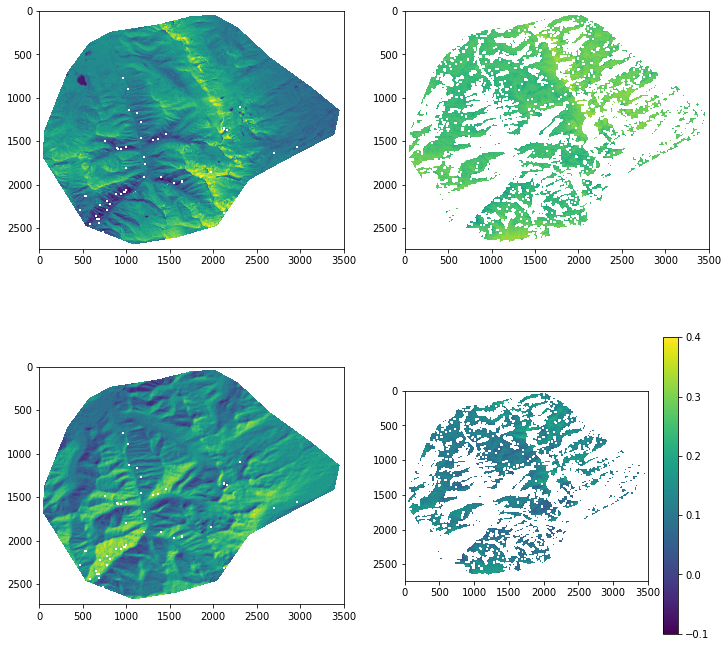

In [12]:
f, axes = plt.subplots(2, 2, figsize = (12,12))
axes[0,0].imshow(sd, vmin = 0, vmax = 3)
axes[1,0].imshow(inc)
axes[0,1].imshow(unw, vmin = -4, vmax = 4)
a = axes[1,1].imshow(sd_unw, vmin = -0.1, vmax = 0.4)
plt.colorbar(a)

# for ax in axes:
#     for a in ax:
#         a.axis('off')

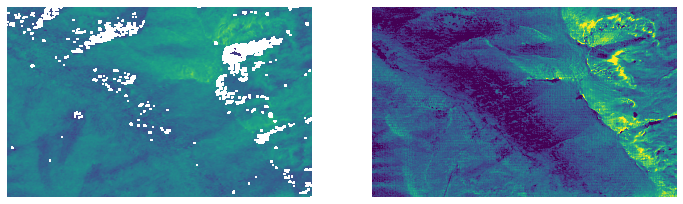

In [13]:
f, axes = plt.subplots(1,2, figsize = (12,12))
extent = [500,1000,1200,2000]
axes[0].imshow(sd_unw[extent[0]:extent[1],extent[2]:extent[3]], vmin = -0.1, vmax = 0.4)
axes[1].imshow(sd[extent[0]:extent[1],extent[2]:extent[3]], vmin = 1, vmax = 3)
for ax in axes:
    ax.axis('off')

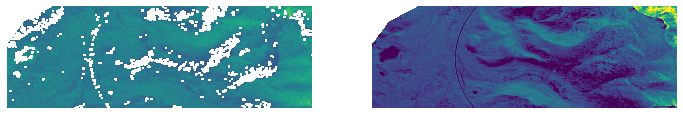

In [14]:
f, axes = plt.subplots(1,2, figsize = (12,12))
extent = [300,700,500,1700]
axes[0].imshow(sd_unw[extent[0]:extent[1],extent[2]:extent[3]], vmin = -0.1, vmax = 0.4)
axes[1].imshow(sd[extent[0]:extent[1],extent[2]:extent[3]], vmin = 1, vmax = 3)
for ax in axes:
    ax.axis('off')

In [15]:
x_div = sd.shape[0]/5
y_div = sd.shape[1]/6

x_marks = np.linspace(0,sd.shape[0],6)
y_marks = np.linspace(0,sd.shape[1],7)

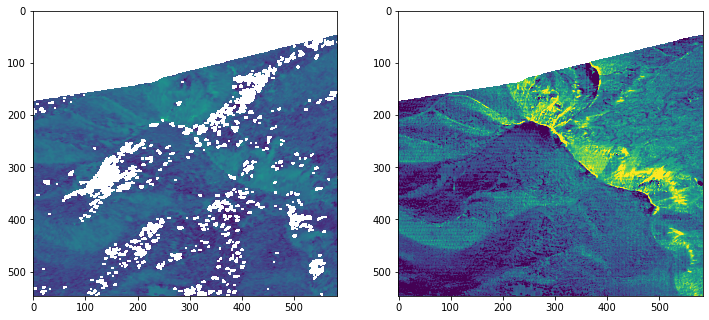

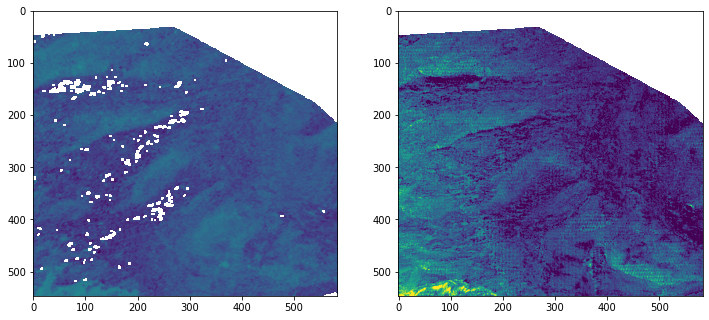

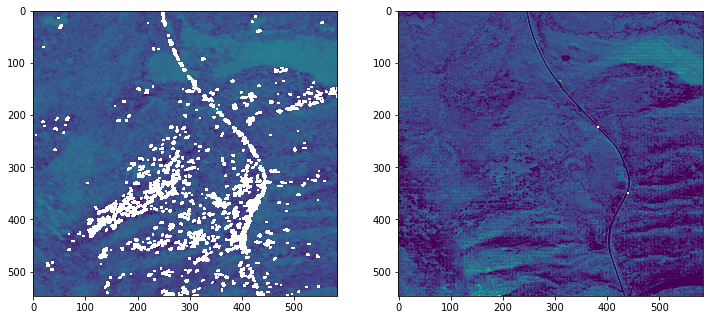

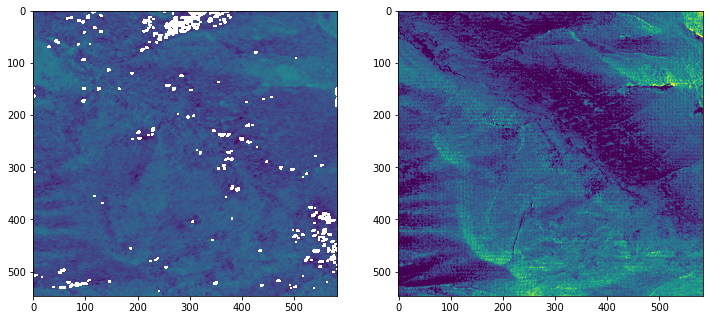

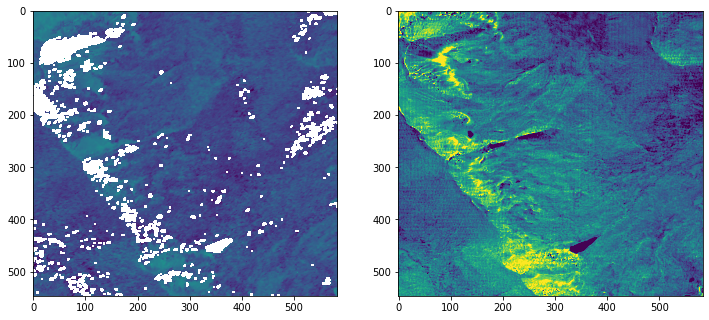

...

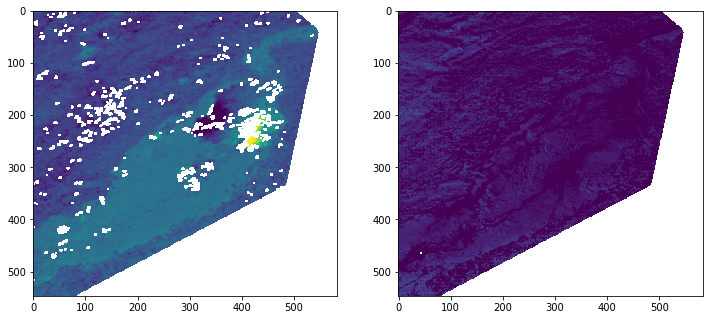

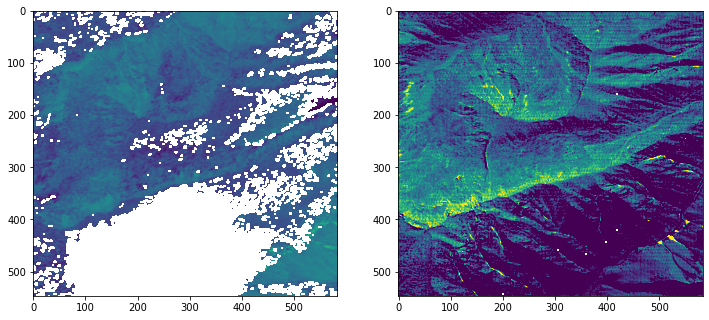

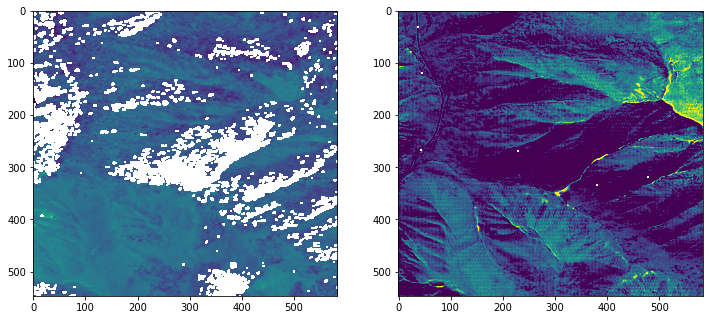

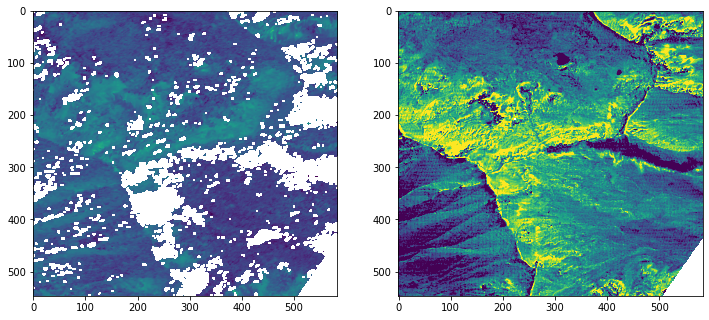

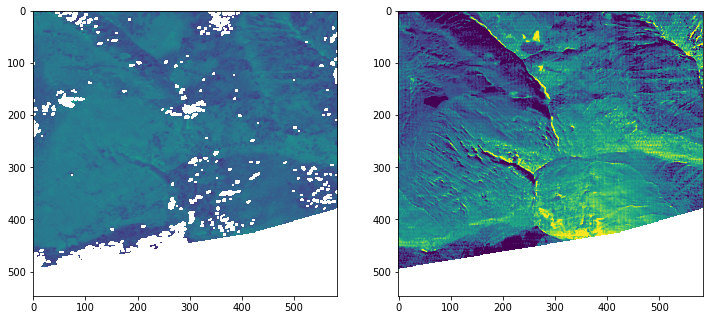

In [28]:
date = '2021-02-03_2021-02-10'
fig_dir = join('../../figures/unw_banner_compare/examples',date)
os.makedirs(fig_dir, exist_ok=True)
for i, x_mark in enumerate(x_marks[:-1]):
    for j, y_mark in enumerate(y_marks[:-1]):
            extent = [x_mark,x_marks[i+1],y_mark,y_marks[j+1]]
            extent = [int(i) for i in extent]
            if (np.sum(np.isnan(sd_unw[extent[0]:extent[1],extent[2]:extent[3]]))/ sd[extent[0]:extent[1],extent[2]:extent[3]].size) < 0.33:
                sub_sd = sd[extent[0]:extent[1],extent[2]:extent[3]]
                sub_unw = sd_unw[extent[0]:extent[1],extent[2]:extent[3]]
                f, axes = plt.subplots(1,2, figsize = (12,12))
                
                axes[0].imshow(sd_unw[extent[0]:extent[1],extent[2]:extent[3]], vmin = -0.1, vmax = 0.4)
                axes[1].imshow(sd[extent[0]:extent[1],extent[2]:extent[3]], vmin = 1, vmax = 3)
                # plt.savefig(join(fig_dir, f'subset_{i}_{j}'))
                plt.show()

        # for ax in axes:
        #     ax.axis('off')

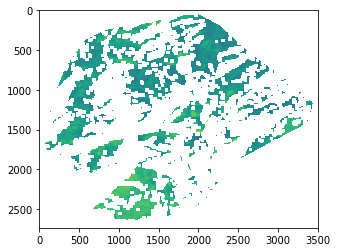

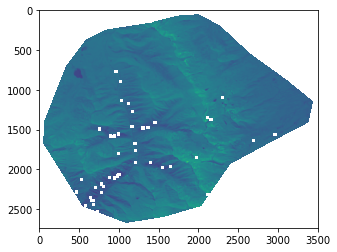

In [60]:
from scipy.ndimage import gaussian_filter
unw_filt = gaussian_filter(sd_unw, 2)
plt.imshow(unw_filt)
plt.show()

from scipy.ndimage import gaussian_filter
sd_filt = gaussian_filter(sd, 2)
plt.imshow(sd_filt)
plt.show()

In [37]:
from scipy.stats import pearsonr
pearsonr(sub_sd[(~np.isnan(sub_sd)) & (~np.isnan(sub_unw))], sub_unw[(~np.isnan(sub_sd)) & (~np.isnan(sub_unw))])
#corr = (sub_unw/np.nanstd(sub_unw)) * (sub_sd/np.nanstd(sub_sd))

(0.2441926884103969, 0.0)

In [75]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 20}

In [78]:
len(sd_filt[(~np.isnan(sd_filt)) & (~np.isnan(unw_filt))])

3496416

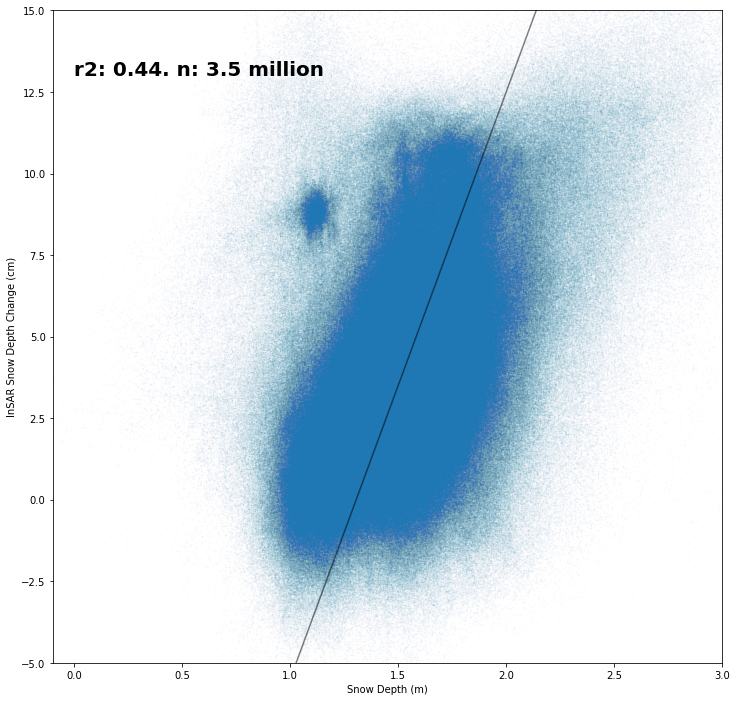

In [98]:
plt.figure(figsize=(12,12))
plt.scatter(sd_filt[(~np.isnan(sd_filt)) & (~np.isnan(unw_filt))], 100*unw_filt[(~np.isnan(sd_filt)) & (~np.isnan(unw_filt))], alpha = 0.02, s= 1)
plt.xlabel('Snow Depth (m)')
plt.ylabel('InSAR Snow Depth Change (cm)')
r2 = round(pearsonr(sd_filt[(~np.isnan(sd_filt)) & (~np.isnan(unw_filt))], 100*unw_filt[(~np.isnan(sd_filt)) & (~np.isnan(unw_filt))])[0], 2)
txt =f'r2: {r2}. n: 3.5 million'
plt.text(x = 0, y = 13, s= txt, fontdict=font)
plt.xlim(-0.1, 3)
plt.ylim(-5, 15)
x = np.arange(0, 2.2, 0.01)
y = -23.5 + 18 *x
plt.plot(x, y, color = 'black', alpha =0.5)

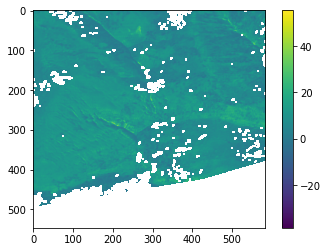

In [34]:
plt.imshow(corr)
plt.colorbar()

## March 3 to March 10 2021 - melt season

In [17]:
fp = '../../data/jpl/lowman_23205_21015-008_21017-018_0007d_s01_L090HH_01.unw.grd.clip.ma.tiff'
date_dic[basename(fp).split('.')[0]]

DatetimeIndex(['2021-03-03', '2021-03-10'], dtype='datetime64[ns]', freq=None)

In [18]:
with rio.open(fp) as unw:
    unw = unw.read(1)
sd_unw = v_inversion(unw, inc)

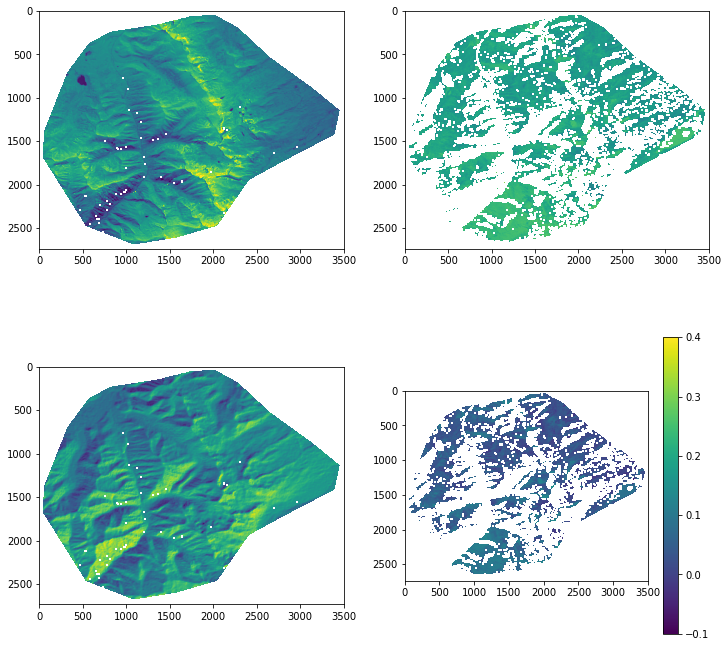

In [19]:
f, axes = plt.subplots(2, 2, figsize = (12,12))
axes[0,0].imshow(sd, vmin = 0, vmax = 3)
axes[1,0].imshow(inc)
axes[0,1].imshow(unw, vmin = -4, vmax = 4)
a = axes[1,1].imshow(sd_unw, vmin = -0.1, vmax = 0.4)
plt.colorbar(a)

# for ax in axes:
#     for a in ax:
#         a.axis('off')

# SUBSET ALL IMAGES TO FIGURES

In [20]:
import copy

In [21]:
import matplotlib
dirs = []
for fp in unw_fps:
    plt.close('all')
    dates = date_dic[basename(fp).split('.')[0]]
    date1 = dates[0].strftime('%Y-%m-%d')
    date2 = dates[1].strftime('%Y-%m-%d')
    date = f'{date1}_{date2}'

    with rio.open(fp) as unw:
        unw = unw.read(1)
    sd_unw = v_inversion(unw, inc)
    sd_unw = sd_unw*100

    fig_dir = join('../../figures/unw_banner_compare/examples',date)
    print(fig_dir)
    dirs.append(fig_dir)
    os.makedirs(fig_dir, exist_ok=True)
    for i, x_mark in enumerate(x_marks[:-1]):
        for j, y_mark in enumerate(y_marks[:-1]):
                extent = [x_mark,x_marks[i+1],y_mark,y_marks[j+1]]
                extent = [int(i) for i in extent]
                sd_sub = sd_unw[extent[0]:extent[1],extent[2]:extent[3]]
                if (np.sum(np.isnan(sd_sub))/ sd_sub.size) < 0.33:
                    f, axes = plt.subplots(1,2, figsize = (12,12))
                    vmin = np.nanquantile(sd_sub,0.01)
                    vmax = np.nanquantile(sd_sub,0.99)
                    #sub_ma = np.ma.array(sd_sub, mask = np.isnan(sd_sub))
                    cmap = copy.copy(matplotlib.cm.viridis)
                    cmap.set_bad(color = 'grey')
                    cmap.set_under
                    # cmap.set_under(color = 'white')
                    # sd_sub[np.isnan(sd[extent[0]:extent[1],extent[2]:extent[3]])] = -100

                    im = axes[1].imshow(sd_sub, vmin = vmin, vmax = vmax, cmap = cmap)
                    
                    cmap2 = copy.copy(matplotlib.cm.viridis)
                    cmap2.set_bad(color = 'white')
                    cmap2.set_under(color = (0.2,0.4,0.6,0))
                    lidar_sub = sd[extent[0]:extent[1],extent[2]:extent[3]]
                    lidar_mask = lidar_sub.copy()
                    lidar_mask[~np.isnan(lidar_mask)] = -100
                    axes[1].imshow(lidar_mask, cmap = cmap2, vmin = -99, vmax = -98)

                    im2 = axes[0].imshow(lidar_sub, vmin = 1, vmax = 4, cmap = 'gnuplot2')
                    f.subplots_adjust(right = 0.8)
                    cbar_ax = f.add_axes([0.85, 0.35, 0.05, 0.3])
                    cbar = f.colorbar(im, cax = cbar_ax)
                    # cbar.set_label('Snow Depth Change (cm))', rotation=270, labelpad=-40)
                    cbar.set_label('Snow Depth Change (cm)', rotation=270, labelpad = 20)

                    for ax in axes:
                        ax.axis('off')
                    plt.savefig(join(fig_dir, f'subset_{i}_{j}'))
                    plt.show()
for d in dirs:
    if len(os.listdir(d)) == 0:
        os.rmdir(d)

KeyboardInterrupt: 

../../figures/unw_banner_compare/examples/2021-02-03_2021-02-10_interp


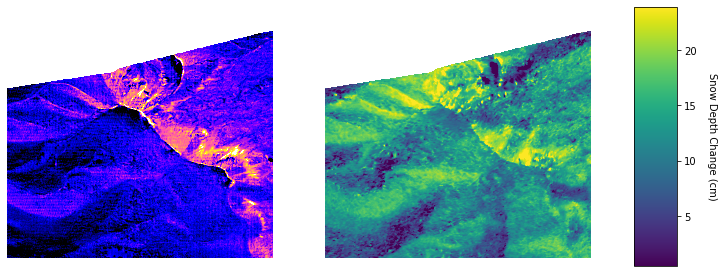

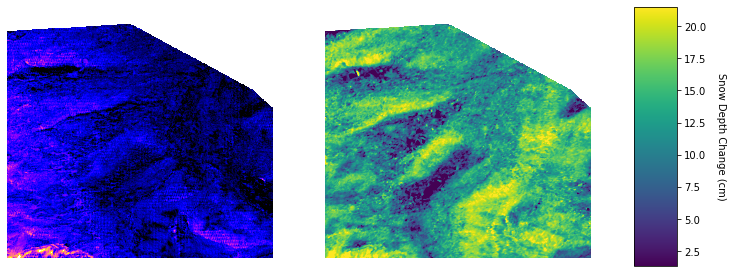

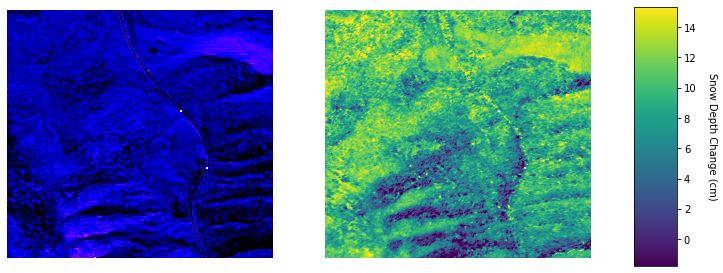

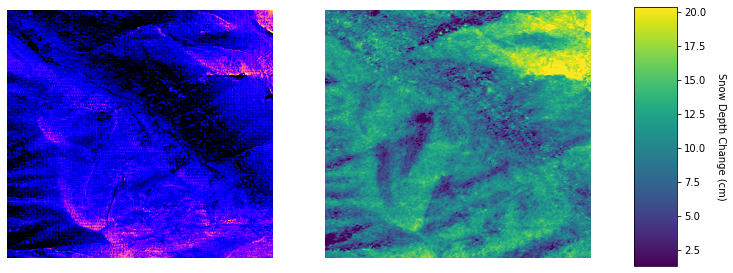

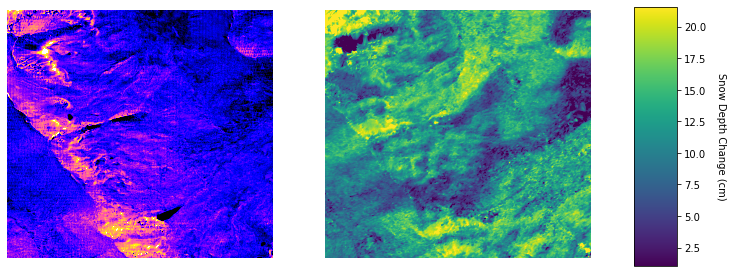

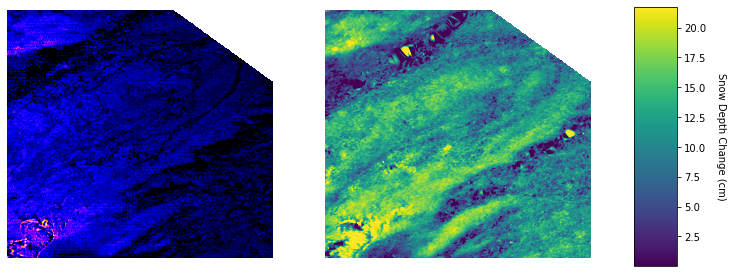

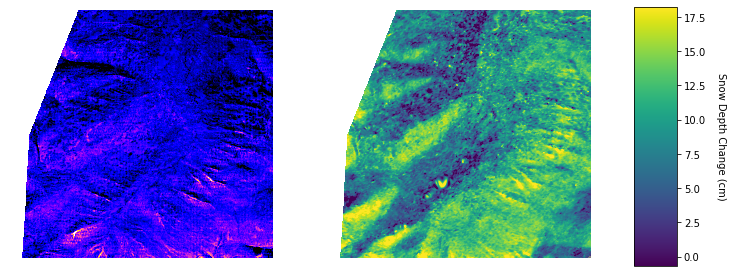

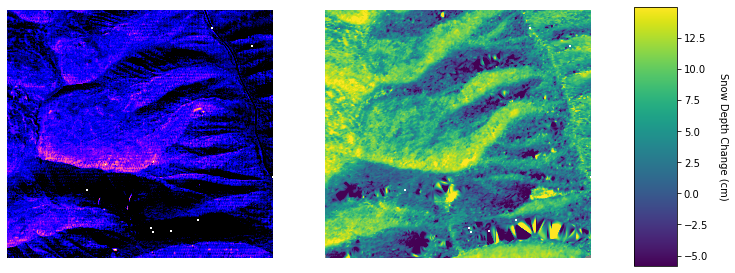

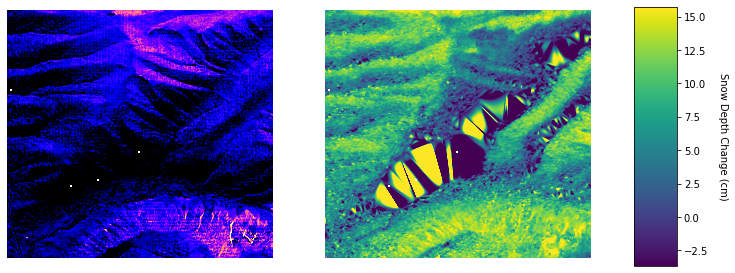

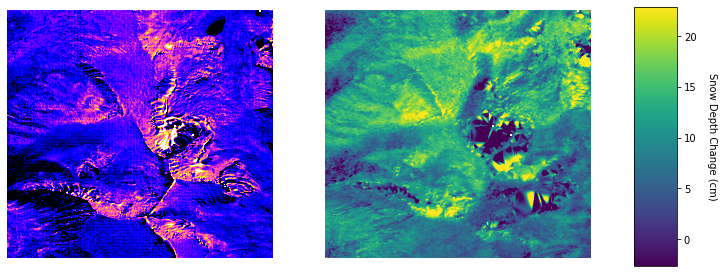

KeyboardInterrupt: 

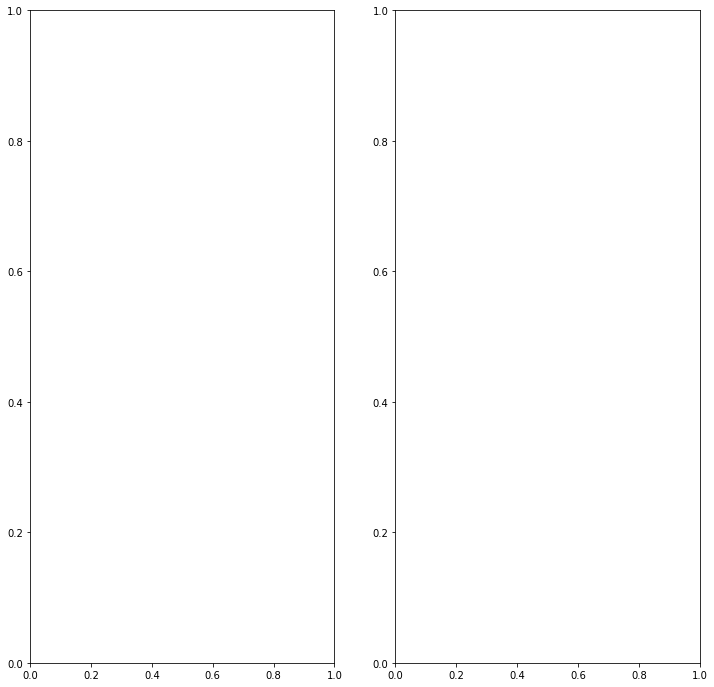

In [ ]:
dirs = []
for fp in unw_fps:
    plt.close('all')
    dates = date_dic[basename(fp).split('.')[0]]
    date1 = dates[0].strftime('%Y-%m-%d')
    date2 = dates[1].strftime('%Y-%m-%d')
    date = f'{date1}_{date2}'

    with rio.open(fp) as unw:
        unw = unw.read(1)
    sd_unw = v_inversion(unw, inc)
    sd_unw = sd_unw*100

    fig_dir = join('../../figures/unw_banner_compare/examples',date+'_interp')
    print(fig_dir)
    dirs.append(fig_dir)
    os.makedirs(fig_dir, exist_ok=True)
    for i, x_mark in enumerate(x_marks[:-1]):
        for j, y_mark in enumerate(y_marks[:-1]):
                extent = [x_mark,x_marks[i+1],y_mark,y_marks[j+1]]
                extent = [int(i) for i in extent]
                sd_sub = sd_unw[extent[0]:extent[1],extent[2]:extent[3]]
                if (np.sum(np.isnan(sd_sub))/ sd_sub.size) < 0.33:
                    f, axes = plt.subplots(1,2, figsize = (12,12))
                    vmin = np.nanquantile(sd_sub,0.01)
                    vmax = np.nanquantile(sd_sub,0.99)
                    #sub_ma = np.ma.array(sd_sub, mask = np.isnan(sd_sub))
                    cmap = copy.copy(matplotlib.cm.viridis)
                    cmap.set_bad(color = 'grey')
                    cmap.set_under
                    # cmap.set_under(color = 'white')
                    # sd_sub[np.isnan(sd[extent[0]:extent[1],extent[2]:extent[3]])] = -100
                    ## Interpolate!
                    x = np.arange(0, sd_sub.shape[1])
                    y = np.arange(0, sd_sub.shape[0])
                    #mask invalid values
                    array = np.ma.masked_invalid(sd_sub)
                    xx, yy = np.meshgrid(x, y)
                    #get only the valid values
                    x1 = xx[~array.mask]
                    y1 = yy[~array.mask]
                    newarr = array[~array.mask]

                    GD1 = interpolate.griddata((x1, y1), newarr.ravel(),
                                            (xx, yy),
                                                method='cubic')
                    im = axes[1].imshow(GD1, vmin = vmin, vmax = vmax, cmap = cmap)
                    
                    cmap2 = copy.copy(matplotlib.cm.viridis)
                    cmap2.set_bad(color = 'white')
                    cmap2.set_under(color = (0.2,0.4,0.6,0))
                    lidar_sub = sd[extent[0]:extent[1],extent[2]:extent[3]]
                    lidar_mask = lidar_sub.copy()
                    lidar_mask[~np.isnan(lidar_mask)] = -100
                    axes[1].imshow(lidar_mask, cmap = cmap2, vmin = -99, vmax = -98)

                    # vmin = np.nanquantile(lidar_sub, 0.01)
                    # vmax = np.nanquantile(lidar_sub, 0.999)
                    # im2 = axes[0].imshow(lidar_sub, vmin = vmin, vmax = vmax, cmap = 'gnuplot2')
                    im2 = axes[0].imshow(lidar_sub, vmin = 1, vmax = 3.5, cmap = 'gnuplot2')
                    f.subplots_adjust(right = 0.8)
                    cbar_ax = f.add_axes([0.85, 0.35, 0.05, 0.3])
                    cbar = f.colorbar(im, cax = cbar_ax)
                    # cbar.set_label('Snow Depth Change (cm))', rotation=270, labelpad=-40)
                    cbar.set_label('Snow Depth Change (cm)', rotation=270, labelpad = 20)

                    for ax in axes:
                        ax.axis('off')
                    plt.savefig(join(fig_dir, f'interp_subset_{i}_{j}'))
                    plt.show()
for d in dirs:
    if len(os.listdir(d)) == 0:
        os.rmdir(d)

In [ ]:
fp = unw_fps[0]
print(date_dic[basename(fp).split('.')[0]])

with rio.open(fp) as unw:
    unw = unw.read(1)
sd_unw = v_inversion(unw, inc)

DatetimeIndex(['2021-02-03', '2021-02-10'], dtype='datetime64[ns]', freq=None)
